### Notebook for the all fetal cells trajectory analysis with CellRank RNA Velocity

- **Developed by:** Anna Maguza
- **Place:** Wuerzburg Institute for System Immunology
- **Created date:** 24th June 2024
- **Last modified date:** 24th June 2024

##### Import packages

In [1]:
import numpy as np

import cellrank as cr
import scanpy as sc
import scvelo as scv

scv.settings.verbosity = 3
scv.settings.set_figure_params("scvelo")
cr.settings.verbosity = 2

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy as sci
import anndata as ad
from scipy import io,sparse
import os

##### Setup working environment

In [3]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.10.7
scanpy      1.10.1
-----
PIL                         10.3.0
absl                        NA
annotated_types             0.6.0
anyio                       NA
arrow                       1.3.0
asttokens                   NA
attr                        23.2.0
attrs                       23.2.0
babel                       2.14.0
backoff                     2.2.1
brotli                      1.1.0
bs4                         4.12.3
cellrank                    2.0.4
certifi                     2024.02.02
cffi                        1.16.0
charset_normalizer          3.3.2
chex                        0.1.86
click                       8.1.7
cloudpickle                 3.0.0
colorama                    0.4.6
comm                        0.2.2
contextlib2                 NA
croniter                    NA
cycler                      0.12.1
cython_runtime              NA
dateutil                    2.9.0
debugpy                     1.8.1
decorator                   5.1.1
dee

##### Upload anndata object

In [4]:
adata = sc.read_h5ad('/mnt/LaCIE/annaM/gut_project/Processed_data/Gut_data/Fetal_all_cells/E-MTAB-9536_raw_velocity_anndata_filtered.h5ad')

#### Run CellRank

In [5]:
adata

AnnData object with n_obs × n_vars = 87784 × 28942
    obs: 'batch', 'Sample_ID', 'Cell Type', 'Study_name', 'Donor_ID', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Sex', 'Library_Preparation_Protocol', 'Age_group', 'Location', 'Cell States', 'Cell States GCA', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_counts', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids', 'feature_types', 'seqname', 'source', 'feature', 'start', 'end', 'transcript_id', 'ensembl_trancsript_id_old', 'ensembl_trancsript_id_cmp_ref', 'transcript_length', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'Age_colors', 'Age_group_colors', 'Cell States_colors', 'Cell Type_colors', 'Diagnosis_colors', 'Donor_ID_colors', 'Fraction_colors', 'Library_Preparation_Protocol_colors', 'Location_colors', 'Region code_colors', 'Sex_colors', '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'neighbors',

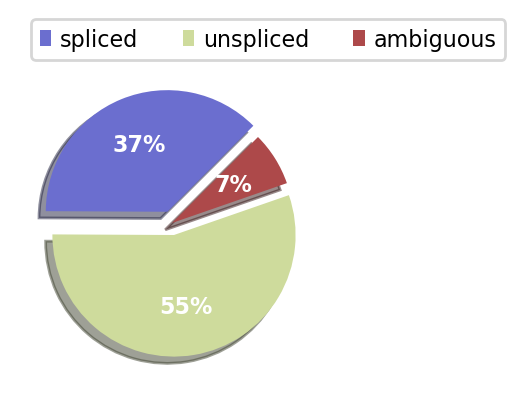

AnnData object with n_obs × n_vars = 87784 × 28942
    obs: 'batch', 'Sample_ID', 'Cell Type', 'Study_name', 'Donor_ID', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Sex', 'Library_Preparation_Protocol', 'Age_group', 'Location', 'Cell States', 'Cell States GCA', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_counts', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids', 'feature_types', 'seqname', 'source', 'feature', 'start', 'end', 'transcript_id', 'ensembl_trancsript_id_old', 'ensembl_trancsript_id_cmp_ref', 'transcript_length', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'Age_colors', 'Age_group_colors', 'Cell States_colors', 'Cell Type_colors', 'Diagnosis_colors', 'Donor_ID_colors', 'Fraction_colors', 'Library_Preparation_Protocol_colors', 'Location_colors', 'Region code_colors', 'Sex_colors', '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'neighbors',

In [6]:
scv.pl.proportions(adata)
adata

In [7]:
scv.pp.filter_and_normalize(
    adata, min_shared_counts=20, n_top_genes=2000, subset_highly_variable=False
)

sc.tl.pca(adata)
sc.pp.neighbors(adata, n_pcs=30, n_neighbors=30, random_state=0)
scv.pp.moments(adata, n_pcs=None, n_neighbors=None)

Filtered out 16740 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
computing PCA
    with n_comps=50


/home/amaguza/miniforge3/envs/CellRank_env/lib/python3.10/site-packages/scvelo/preprocessing/utils.py:705: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  log1p(adata)


    finished (0:00:03)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:30)
computing moments based on connectivities
    finished (0:00:36) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [8]:
scv.tl.recover_dynamics(adata, n_jobs=8)

recovering dynamics (using 8/64 cores)
or disable the progress bar using `show_progress_bar=False`.
    finished (0:03:49) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [9]:
scv.tl.velocity(adata, mode="dynamical")

computing velocities
    finished (0:00:11) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [10]:
vk = cr.kernels.VelocityKernel(adata)

In [11]:
vk.compute_transition_matrix()

Computing transition matrix using `'deterministic'` model


100%|███████████████████████████████| 87784/87784 [00:17<00:00, 4913.70cell/s]


Using `softmax_scale=1.9986`


100%|███████████████████████████████| 87784/87784 [00:12<00:00, 6840.10cell/s]


    Finish (0:00:31)


VelocityKernel[n=87784, model='deterministic', similarity='correlation', softmax_scale=1.999]

In [12]:
vk = cr.kernels.VelocityKernel(adata)

In [13]:
vk.compute_transition_matrix()

Computing transition matrix using `'deterministic'` model


100%|███████████████████████████████| 87784/87784 [00:12<00:00, 6954.25cell/s]


Using `softmax_scale=1.9986`


100%|███████████████████████████████| 87784/87784 [00:12<00:00, 7051.59cell/s]


    Finish (0:00:26)


VelocityKernel[n=87784, model='deterministic', similarity='correlation', softmax_scale=1.999]

In [14]:
ck = cr.kernels.ConnectivityKernel(adata)
ck.compute_transition_matrix()

combined_kernel = 0.8 * vk + 0.2 * ck

Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)


In [15]:
print(combined_kernel)

(0.8 * VelocityKernel[n=87784] + 0.2 * ConnectivityKernel[n=87784])


Projecting transition matrix onto `umap`
Adding `adata.obsm['T_fwd_umap']`
    Finish (0:00:11)


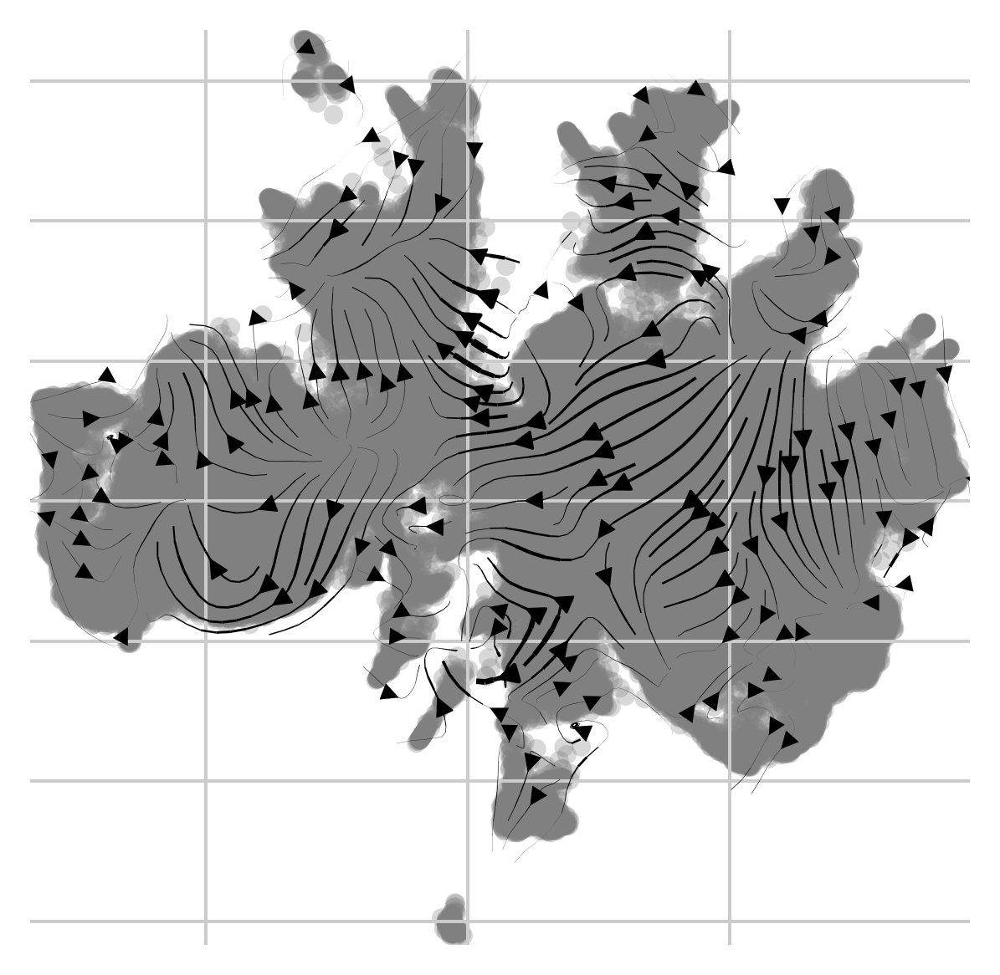

In [16]:
vk.plot_projection()

In [19]:
df =adata.obs['Cell States'].value_counts()

Simulating `100` random walks of maximum length `200`


100%|██████████████████████████████████████| 100/100 [00:12<00:00,  8.21sim/s]


    Finish (0:00:12)
Plotting random walks


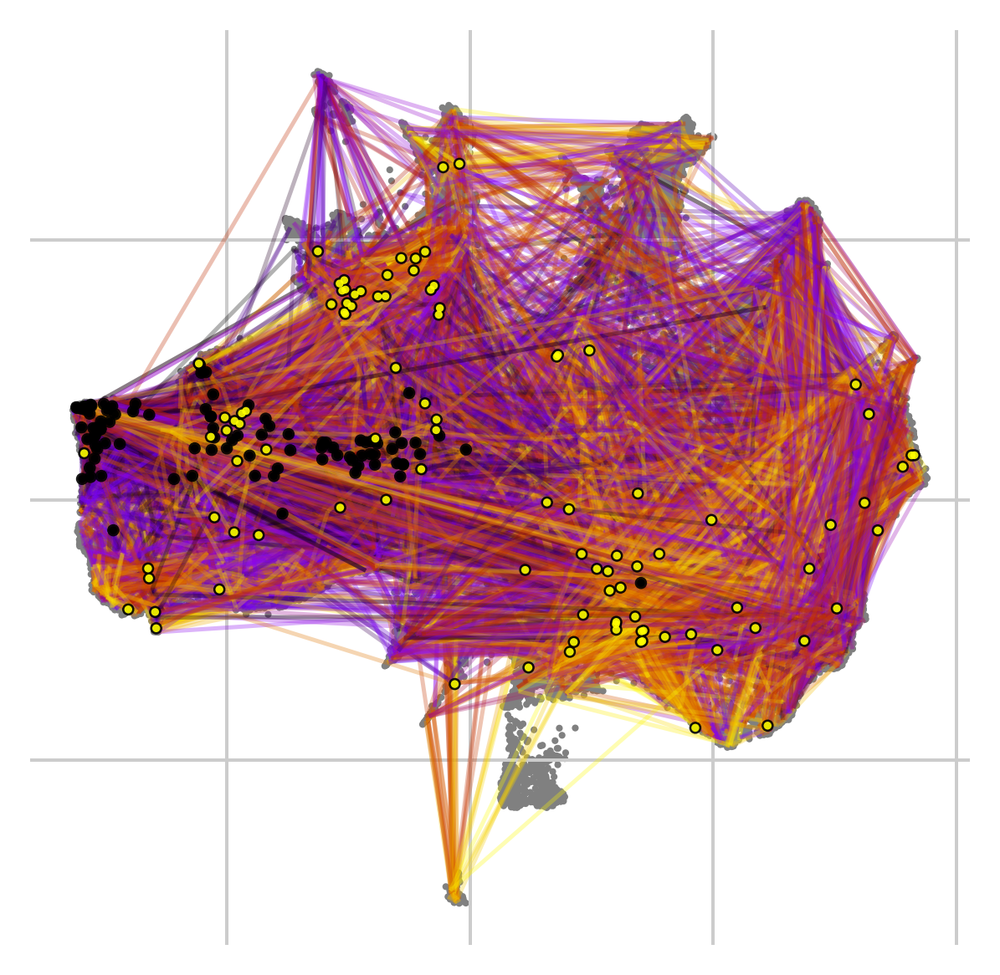

In [20]:
vk.plot_random_walks(start_ixs={"Cell States": "RPS10+_RPS17+_SC"}, max_iter=200, seed=0)

Simulating `100` random walks of maximum length `200`


100%|██████████████████████████████████████| 100/100 [00:12<00:00,  8.24sim/s]


    Finish (0:00:12)
Plotting random walks


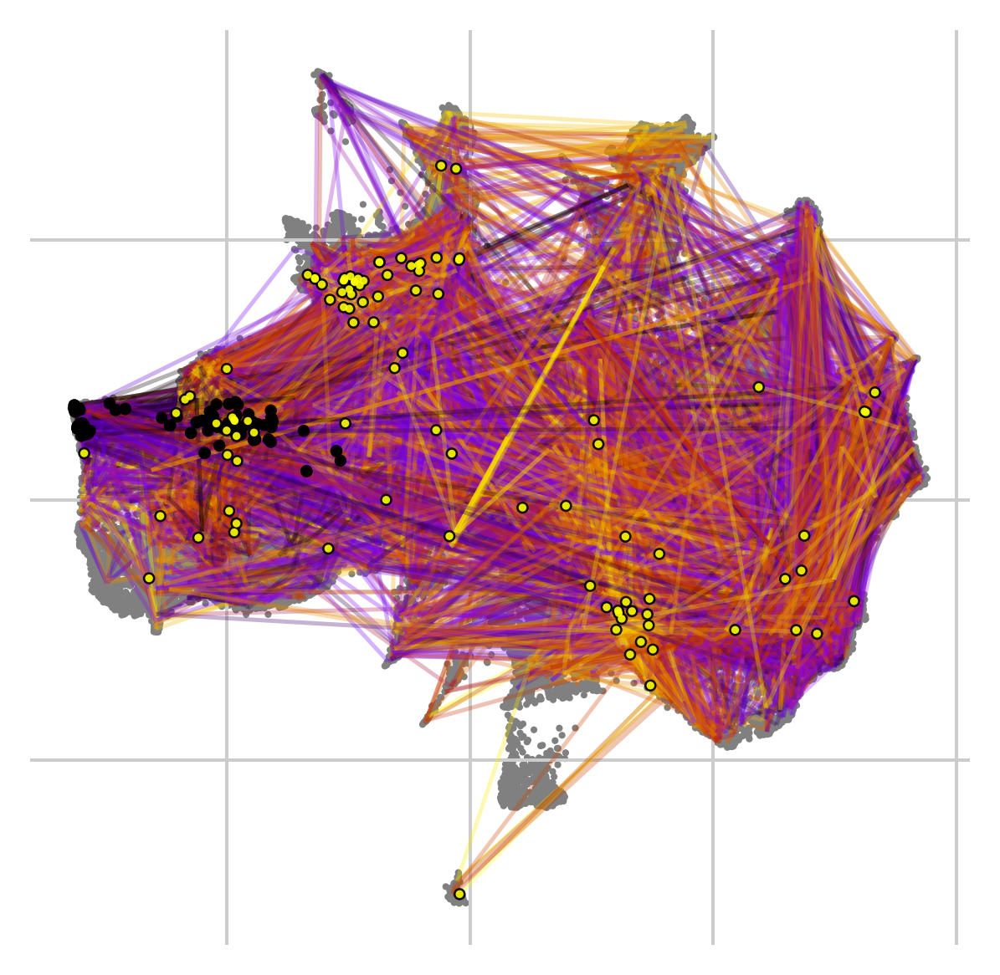

In [21]:
vk.plot_random_walks(start_ixs={"Cell States": "FXYD3+_CKB+_SC"}, max_iter=200, seed=0)

Simulating `100` random walks of maximum length `200`


100%|██████████████████████████████████████| 100/100 [00:12<00:00,  8.23sim/s]


    Finish (0:00:12)
Plotting random walks


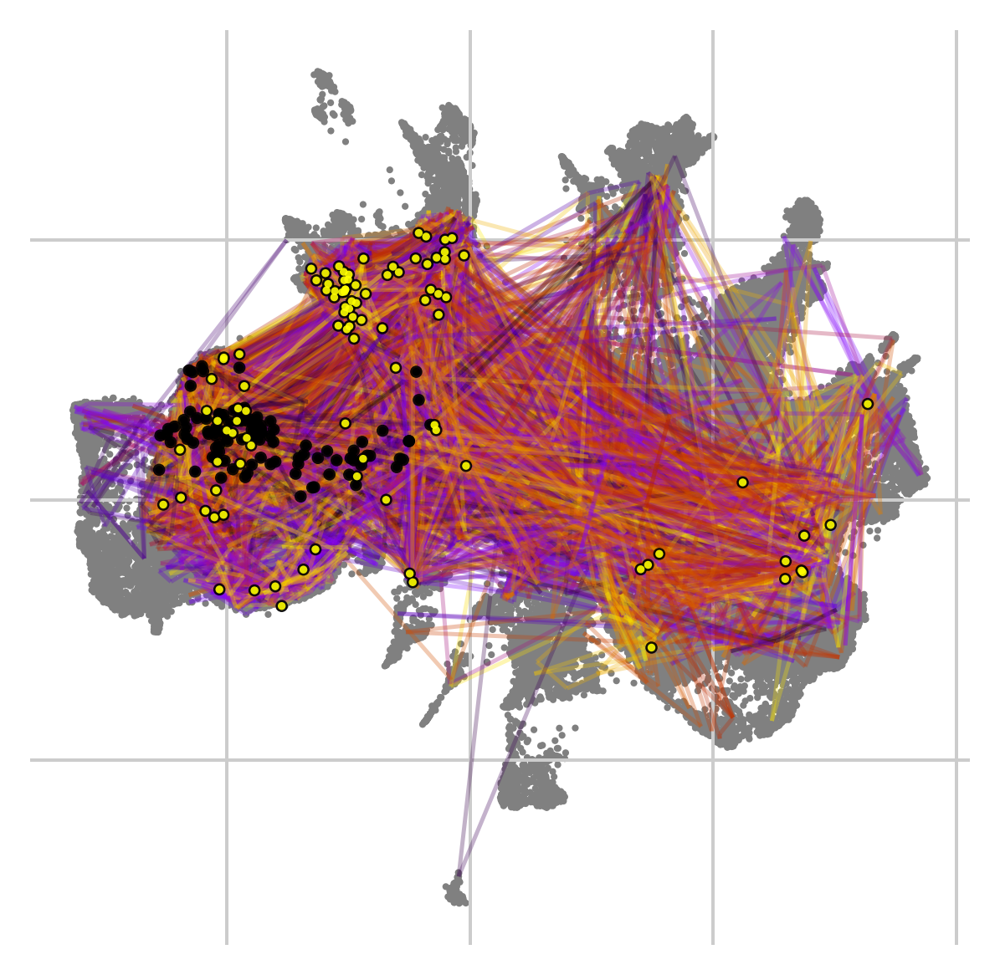

In [22]:
vk.plot_random_walks(start_ixs={"Cell States": "MTRNR2L12+ASS1+_SC"}, max_iter=200, seed=0)

Simulating `100` random walks of maximum length `200`


100%|██████████████████████████████████████| 100/100 [00:12<00:00,  8.17sim/s]


    Finish (0:00:12)
Plotting random walks


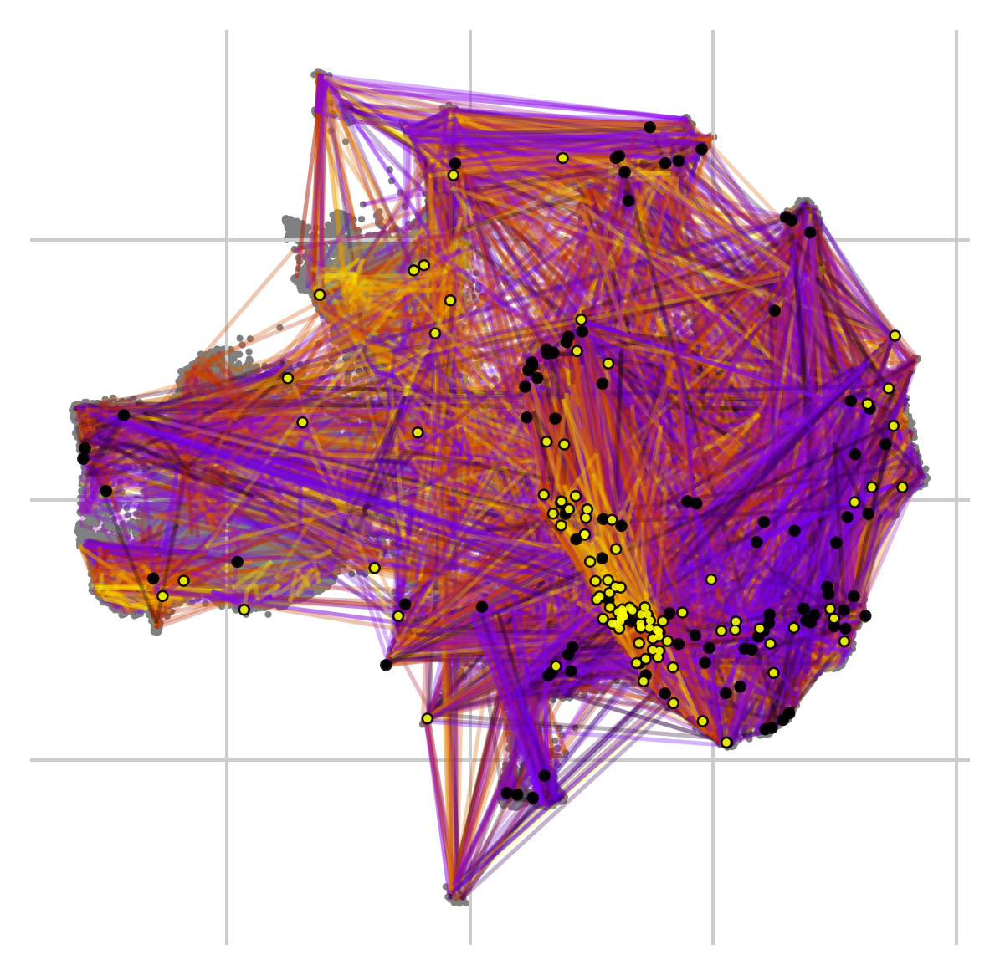

In [25]:
vk.plot_random_walks(start_ixs={"Age": "12Wk"}, max_iter=200, seed=0)

In [26]:
adata.obs

,batch,Sample_ID,Cell Type,Study_name,Donor_ID,Diagnosis,Age,Region code,Fraction,Sex,...,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,n_counts,_scvi_batch,_scvi_labels,initial_size_unspliced,initial_size_spliced,initial_size
cell_id,,,,,,,,,,,,,,,,,,,,,
AAACCTGAGCATCATC-1-Human_colon_16S8159182,0,F72-FPIL-0-SC-1,Epithelial,"Elmentaite, 2021",F72,Fetal Healthy,16Wk,FPIL,SC,Female,...,9,3.296703,8,2.930403,148.007385,0,2,798,271,271
AAACCTGAGCGATCCC-1-Human_colon_16S8159182,0,F72-FPIL-0-SC-1,Epithelial,"Elmentaite, 2021",F72,Fetal Healthy,16Wk,FPIL,SC,Female,...,10,1.515152,33,5.000000,154.536377,0,2,1913,660,660
AAACCTGAGCGTTTAC-1-Human_colon_16S8159182,0,F72-FPIL-0-SC-1,Epithelial,"Elmentaite, 2021",F72,Fetal Healthy,16Wk,FPIL,SC,Female,...,2,1.612903,1,0.806452,126.306442,0,2,310,124,124
AAACCTGAGGATGTAT-1-Human_colon_16S8159182,0,F72-FPIL-0-SC-1,T cells,"Elmentaite, 2021",F72,Fetal Healthy,16Wk,FPIL,SC,Female,...,3,3.614458,2,2.409639,138.072296,0,7,185,83,83
AAACCTGCAAATTGCC-1-Human_colon_16S8159182,0,F72-FPIL-0-SC-1,Endothelial,"Elmentaite, 2021",F72,Fetal Healthy,16Wk,FPIL,SC,Female,...,1,1.250000,4,5.000000,152.799988,0,1,248,80,80
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTGTCTAGCCG-1-Human_colon_16S7985395,0,F67-FLI-0-SC-1,Mesenchymal,"Elmentaite, 2021",F67,Fetal Healthy,12Wk,FLI,SC,Female,...,94,3.029326,1125,36.255237,178.012238,0,3,1198,3103,3103
TTTGGTTGTTCGGGCT-1-Human_colon_16S7985395,0,F67-FLI-0-SC-1,Mesenchymal,"Elmentaite, 2021",F67,Fetal Healthy,12Wk,FLI,SC,Female,...,75,3.071253,800,32.760033,177.625305,0,3,962,2442,2442
TTTGGTTTCACTCCTG-1-Human_colon_16S7985395,0,F67-FLI-0-SC-1,Mesenchymal,"Elmentaite, 2021",F67,Fetal Healthy,12Wk,FLI,SC,Female,...,258,6.230379,787,19.005071,172.181351,0,3,1758,4141,4141


In [27]:
vk.write_to_adata()
adata.write(
    "/mnt/LaCIE/annaM/gut_project/Processed_data/Gut_data/Fetal_all_cells/E-MTAB-9536_velocity_kernel.h5ad"
)


+ Upload data

In [82]:
adata = sc.read_h5ad('/mnt/LaCIE/annaM/gut_project/Processed_data/Gut_data/Fetal_all_cells/E-MTAB-9536_velocity_kernel.h5ad')

In [83]:
adata.obs['Cell_States'] = adata.obs['Cell States'].copy()

In [84]:
vk = cr.kernels.VelocityKernel.from_adata(adata, key="T_fwd")

In [85]:
adata.obs['Cell_States'] = adata.obs['Cell_States'].replace('RPS10+_RPS17+_SC', 'Stem cells')
adata.obs['Cell_States'] = adata.obs['Cell_States'].replace('MTRNR2L12+ASS1+_SC', 'Stem cells')
adata.obs['Cell_States'] = adata.obs['Cell_States'].replace('FXYD3+_CKB+_SC', 'Stem cells')

In [48]:
# if Cell_Type is 'T cells', then change 'Cell_States' to 'T cells'
adata.obs['Cell_States'] = adata.obs['Cell_States'].cat.add_categories(['T cells', 'B cells', 'Neuronal', 'Red blood cells', 'Endothelial'])
adata.obs.loc[(adata.obs['Cell Type'] == 'T cells'), 'Cell_States'] = 'T cells'
adata.obs.loc[(adata.obs['Cell Type'] == 'B cells'), 'Cell_States'] = 'B cells'
adata.obs.loc[(adata.obs['Cell Type'] == 'Neuronal'), 'Cell_States'] = 'Neuronal'
adata.obs.loc[(adata.obs['Cell Type'] == 'Red blood cells'), 'Cell_States'] = 'Red blood cells'
adata.obs.loc[(adata.obs['Cell Type'] == 'Endothelial'), 'Cell_States'] = 'Endothelial'

In [86]:
adata.obs['Cell_States'] = adata.obs['Cell_States'].cat.remove_unused_categories()

Simulating `100` random walks of maximum length `200`


100%|██████████████████████████████████████████████████| 100/100 [00:12<00:00,  8.07sim/s]


    Finish (0:00:12)
Plotting random walks


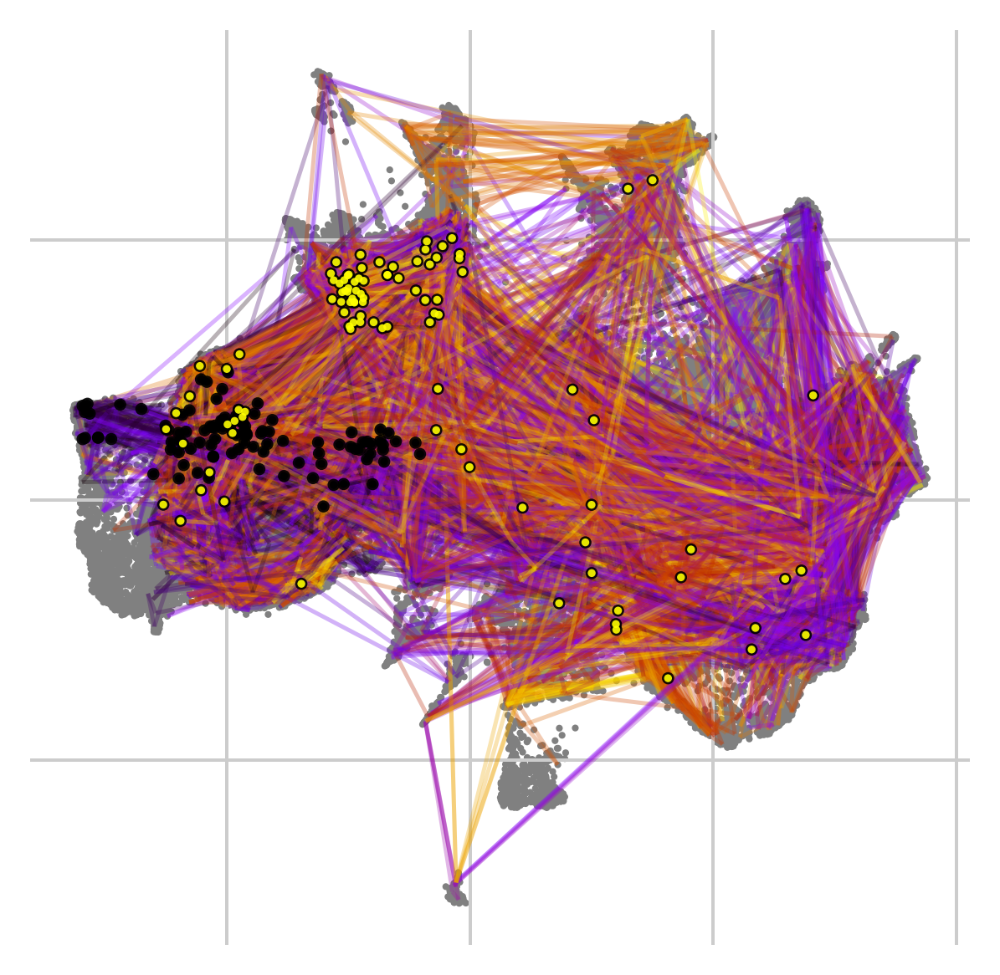

In [61]:
vk.plot_random_walks(start_ixs={"Cell_States": "Stem cells"}, max_iter=200, seed=0)

### Extract trajectory as matrix

In [73]:
from cellrank.kernels.utils import RandomWalk

In [87]:
transition_matrix = vk.transition_matrix

In [88]:
rw = RandomWalk(vk.adata, transition_matrix, start_ixs={"Cell_States": "Stem cells"})

In [89]:
simulations = rw.simulate_many(n_sims=100, max_iter=200, seed=0)

Simulating `100` random walks of maximum length `200`


100%|██████████████████████████████████████████████████| 100/100 [00:13<00:00,  7.63sim/s]
[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.


    Finish (0:00:14)


In [91]:
walks_df = pd.DataFrame(simulations)

In [92]:
cell_ids = vk.adata.obs.index
walks_with_ids = walks_df.applymap(lambda x: cell_ids[int(x)] if not np.isnan(x) else None)

In [93]:
walks_with_ids

,0,1,2,3,4,5,6,7,8,9,...,191,192,193,194,195,196,197,198,199,200
0,TAAGAGAGTCCCTTGT-1-Human_colon_16S8159187,GAAGCAGGTGGTCTCG-1-Human_colon_16S8159187,GTGGGTCGTGTTGAGG-1-Human_colon_16S8159184,CGTTGGGTCTGTACGA-1-Human_colon_16S8159184,AGTGGGAGTTCAGGCC-1-Human_colon_16S8159184,GAATGAAGTGATGTCT-1-Human_colon_16S8159184,TGAGGGAGTGAAAGAG-1-Human_colon_16S8159183,GTGCAGCAGGCGATAC-1-Human_colon_16S8159184,GGAACTTTCTACTCAT-1-FCA_gut8015058,ACCCACTTCAGGTTCA-1-Human_colon_16S8159184,...,AACGTTGAGTGTTGAA-1-Human_colon_16S8159183,GGAAAGCAGCTAACAA-1-Human_colon_16S8159182,TGAAAGATCCACGACG-1-Human_colon_16S8159184,TCAGATGAGTGGGATC-1-Human_colon_16S8159184,CGACCTTCAGACGCAA-1-Human_colon_16S8159184,GCGGGTTCACGGTAGA-1-Human_colon_16S8159183,ACTGTCCTCACATGCA-1-Human_colon_16S8159183,ATCCACCAGCGAAGGG-1-Human_colon_16S8159182,TCAGGATCACGCCAGT-1-Human_colon_16S8159183,CAAGATCGTCTCAACA-1-Human_colon_16S8159183
1,GCACATAAGTCTTGCA-1-Human_colon_16S8159184,GTCTCGTGTTATGTGC-1-Human_colon_16S8159184,GATTCAGCACAACGTT-1-Human_colon_16S8159182,CGCTATCAGGAGTTTA-1-Human_colon_16S8159183,CACACCTGTATCAGTC-1-Human_colon_16S8159182,ATGTGTGCATCCTAGA-1-Human_colon_16S8159182,TCCACACGTTGAGGTG-1-Human_colon_16S8159182,GAACGGAGTTAAAGTG-1-Human_colon_16S8159182,ACTATCTCATGGTAGG-1-Human_colon_16S8159184,GACTGCGTCCACGTTC-1-Human_colon_16S8159184,...,CTTAGGAAGCCCAACC-1-Human_colon_16S7985389,ATAGACCCAGGACGTA-1-Human_colon_16S7985393,AGGTCATTCTGAGTGT-1-Human_colon_16S7985394,GTTAAGCGTTGTCGCG-1-Human_colon_16S7985394,AAAGTAGAGGCACATG-1-Human_colon_16S7985395,TGACGGCCAAGAAAGG-1-Human_colon_16S7985389,GCGCAACAGTTAAGTG-1-Human_colon_16S7985391,GTTCGGGCAAGTCTAC-1-Human_colon_16S7985393,TGTCCCACAAACGTGG-1-Human_colon_16S7985394,CTCTGGTTCGTCCGTT-1-Human_colon_16S7985395
2,GTAACGTCAGCTGCTG-1-Human_colon_16S8159184,ACACCGGCATCCCACT-1-Human_colon_16S8159182,TGAGGGATCACCGTAA-1-Human_colon_16S8159188,CTCTACGGTTACCAGT-1-Human_colon_16S8159187,GTACTCCTCTACTATC-1-Human_colon_16S8159190,CCTATTATCCATTCTA-1-Human_colon_16S8159187,CGTCACTAGATGTGTA-1-Human_colon_16S8159184,TCACAAGGTGTTGAGG-1-Human_colon_16S8159188,CAGCTGGGTTCGGGCT-1-Human_colon_16S8159184,CACAGTATCAGCTCGG-1-Human_colon_16S8159183,...,CATCGGGTCAGCACAT-1-Human_colon_16S8159182,ACAGCCGGTAAGGGCT-1-Human_colon_16S8159184,GTCTTCGCAATGTAAG-1-Human_colon_16S8159182,TCCCGATAGTACGCGA-1-Human_colon_16S8159182,GAAACTCAGACTACAA-1-Human_colon_16S8159183,TACCTTAGTTTGTGTG-1-Human_colon_16S8159184,CAGCTGGGTTCGGGCT-1-Human_colon_16S8159184,TCACAAGGTGTTGAGG-1-Human_colon_16S8159188,GCTGGGTTCCAAAGTC-1-Human_colon_16S8159188,TGGACGCGTTATGTGC-1-Human_colon_16S8159183
3,TACGGGCCAGGCAGTA-1-Human_colon_16S8159187,AGGGAGTGTCCAGTAT-1-FCA_gut8015059,CACATAGAGTATGACA-1-Human_colon_16S8159184,TTGACTTTCTTGAGGT-1-Human_colon_16S8159190,GTCCTCAGTCAGAATA-1-FCA_gut8015060,AAAGTAGCAGATCGGA-1-FCA_gut8015060,GCACTCTCACTACAGT-1-Human_colon_16S8159185,AGATTGCTCTTGTATC-1-Human_colon_16S8159187,GACGGCTCAATCCGAT-1-Human_colon_16S8159184,TCAATCTGTTAAGGGC-1-Human_colon_16S8159187,...,ACGATGTTCTGATTCT-1-Human_colon_16S8159183,CCTCTGACAATAGCGG-1-Human_colon_16S8159190,CTAAGACCAATGGAAT-1-Human_colon_16S8159184,GGGACCTGTTTACTCT-1-Human_colon_16S8159184,ACTGTCCCACACGCTG-1-Human_colon_16S8159182,ACACCCTCAAAGGCGT-1-Human_colon_16S8159184,CATCGAAGTAAGGGAA-1-Human_colon_16S8159182,TGGACGCCAACAACCT-1-Human_colon_16S8159184,ACACCGGCAGCGTAAG-1-Human_colon_16S8159183,CACAGTATCCTTGCCA-1-Human_colon_16S8159182
4,TGCTACCGTAAATACG-1-Human_colon_16S7985391,ATGAGGGAGTGACATA-1-Human_colon_16S7985391,TCGCGTTCAGTAACGG-1-Human_colon_16S7985394,AGGTCATCATACAGCT-1-Human_colon_16S7985393,TTCTCCTTCTGTTGAG-1-Human_colon_16S7985391,GGAATAACATTCCTGC-1-Human_colon_16S7985390,TAGCCGGTCGGTCTAA-1-Human_colon_16S7985395,CCGTTCAGTGACTACT-1-Human_colon_16S7985389,TTTGCGCAGATGCGAC-1-Human_colon_16S7985389,ATCTACTTCAGCACAT-1-Human_colon_16S7985391,...,CATCAAGGTAGAGCTG-1-Human_colon_16S7985392,CGGAGTCAGTGGGCTA-1-Human_colon_16S7985395,AACTTTCGTAGCTGCC-1-Human_colon_16S7985391,GGATGTTCAAACTGCT-1-Human_colon_

In [94]:
walks_with_ids.to_csv('/mnt/LaCIE/annaM/gut_project/Processed_data/Gut_data/Fetal_all_cells/Stem_cells_random_walk_cell_trajectory_order.csv')

### Identify initial and terminal states

In [53]:
g = cr.estimators.GPCCA(vk)
print(g)

GPCCA[kernel=VelocityKernel[n=87784], initial_states=None, terminal_states=None]


Computing Schur decomposition
Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:09)
Calculating minChi criterion in interval `[4, 12]`
Computing `5` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:15)


/home/amaguza/miniforge3/envs/CellRank_env/lib/python3.10/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/home/amaguza/miniforge3/envs/CellRank_env/lib/python3.10/site-packages/scvelo/plotting/scatter.py:694: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/amaguza/miniforge3/envs/CellRank_env/lib/python3.10/site-packages/scvelo/plotting/utils.py:1391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=bg_size, marker=".", c=bg_color, zorder=zord - 2, **kwargs)
/home/amaguza/miniforge3/envs/CellRank_env/lib/python3.10/site-packages/scvelo/plotting/utils.py:1392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=gp_size, marker=".", c=gp_color, zorder=zord - 1, **kwargs)


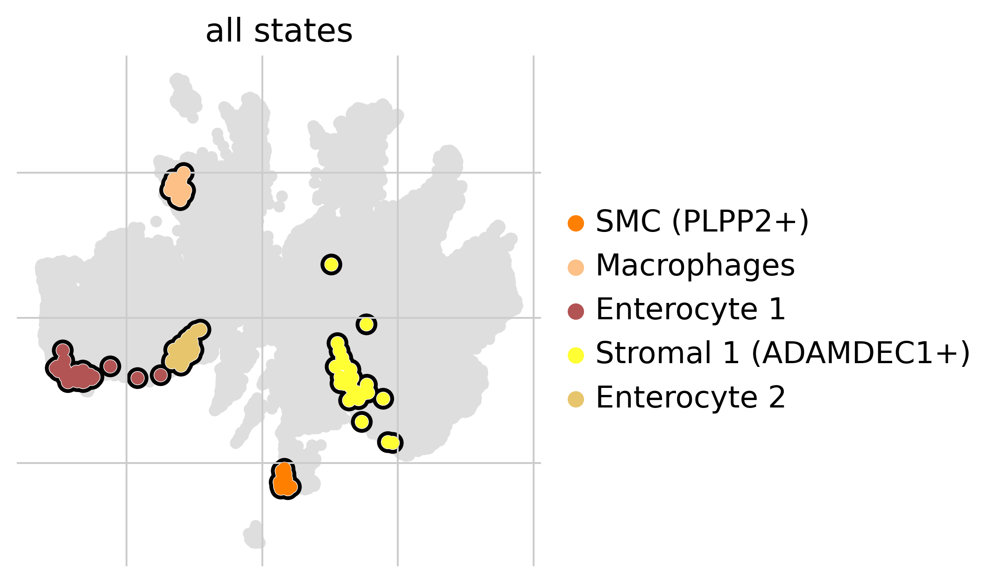

In [54]:
g.fit(cluster_key="Cell_States", n_states=[4, 12])
g.plot_macrostates(which="all", discrete=True, legend_loc="right", s=100)

Adding `adata.obs['term_states_fwd']`
       `adata.obs['term_states_fwd_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


/home/amaguza/miniforge3/envs/CellRank_env/lib/python3.10/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/home/amaguza/miniforge3/envs/CellRank_env/lib/python3.10/site-packages/scvelo/plotting/scatter.py:694: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/amaguza/miniforge3/envs/CellRank_env/lib/python3.10/site-packages/scvelo/plotting/utils.py:1391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=bg_size, marker=".", c=bg_color, zorder=zord - 2, **kwargs)
/home/amaguza/miniforge3/envs/CellRank_env/lib/python3.10/site-packages/scvelo/plotting/utils.py:1392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=gp_size, marker=".", c=gp_color, zorder=zord - 1, **kwargs)


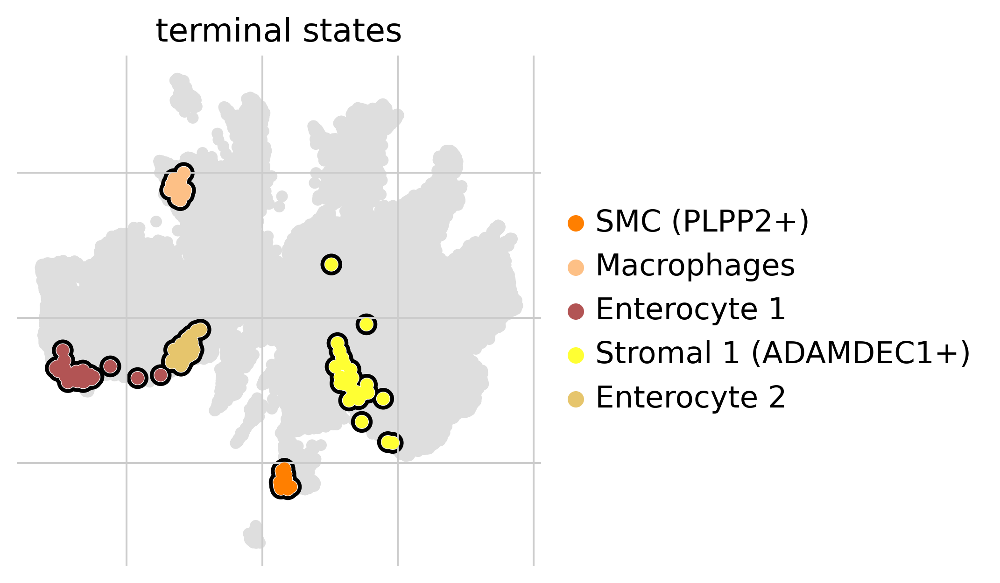

In [55]:
g.predict_terminal_states()
g.plot_macrostates(which="terminal", legend_loc="right", s=100)

/home/amaguza/miniforge3/envs/CellRank_env/lib/python3.10/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/home/amaguza/miniforge3/envs/CellRank_env/lib/python3.10/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(


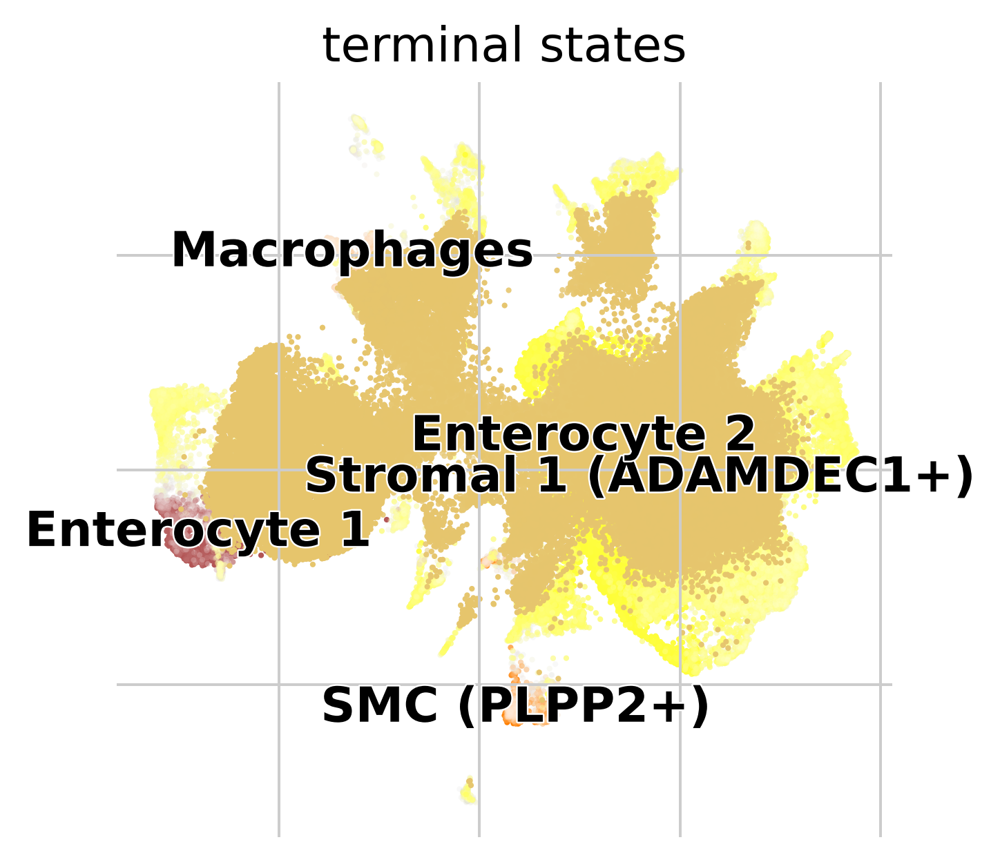

In [56]:
g.plot_macrostates(which="terminal", discrete=False)

Adding `adata.obs['init_states_fwd']`
       `adata.obs['init_states_fwd_probs']`
       `.initial_states`
       `.initial_states_probabilities`
       `.initial_states_memberships
    Finish`


/home/amaguza/miniforge3/envs/CellRank_env/lib/python3.10/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/home/amaguza/miniforge3/envs/CellRank_env/lib/python3.10/site-packages/scvelo/plotting/scatter.py:694: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/amaguza/miniforge3/envs/CellRank_env/lib/python3.10/site-packages/scvelo/plotting/utils.py:1391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=bg_size, marker=".", c=bg_color, zorder=zord - 2, **kwargs)
/home/amaguza/miniforge3/envs/CellRank_env/lib/python3.10/site-packages/scvelo/plotting/utils.py:1392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=gp_size, marker=".", c=gp_color, zorder=zord - 1, **kwargs)


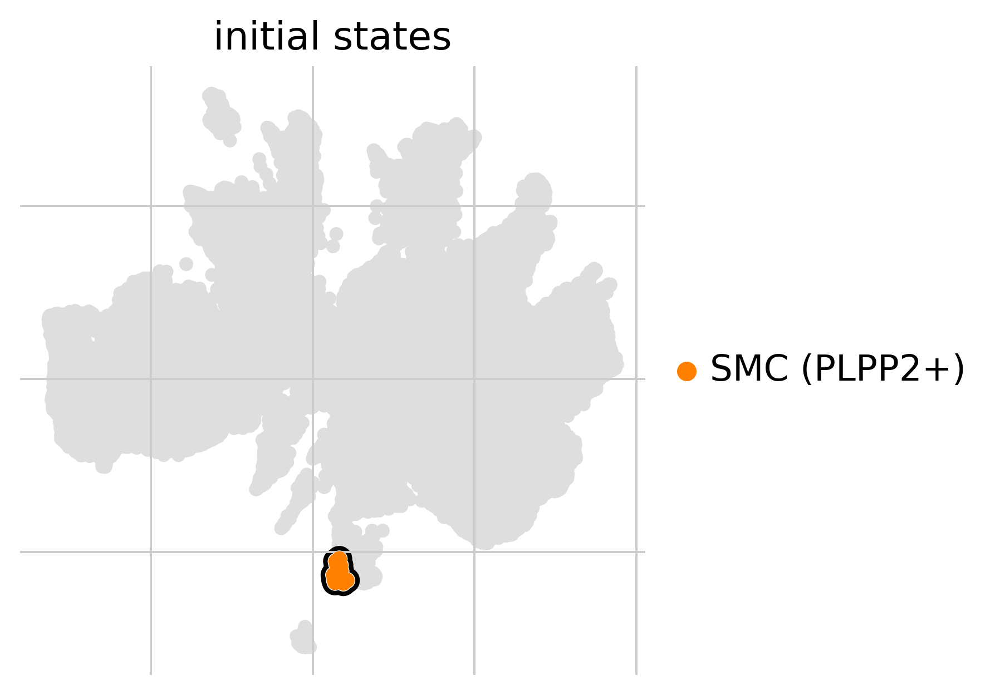

In [58]:
g.predict_initial_states(allow_overlap=True)
g.plot_macrostates(which="initial", legend_loc="right", s=100)

In [59]:
g

GPCCA[kernel=VelocityKernel[n=87784], initial_states=['SMC (PLPP2+)'], terminal_states=['Enterocyte_1', 'Enterocyte_2', 'Macrophages', 'SMC (PLPP2+)', 'Stromal 1 (ADAMDEC1+)']]

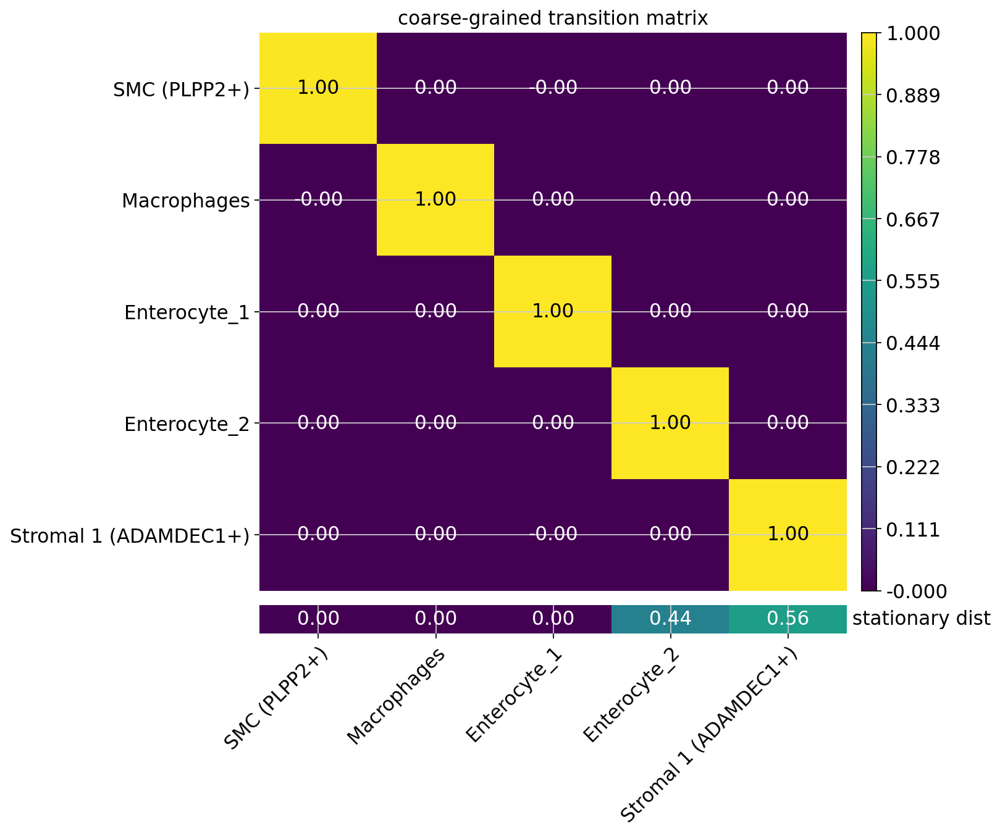

In [60]:
g.plot_coarse_T()